# Tabular Playground August 2022

This notebook will look at the Tabular Playground data from Kaggle's August 2022 competition found here: https://www.kaggle.com/competitions/tabular-playground-series-aug-2022

Goal is to predict products that will fail. 

There are a training and a test set.

In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

In [126]:
data = pd.read_csv('./data/train.csv')
data.head()

,id,product_code,loading,attribute_0,attribute_1,attribute_2,attribute_3,measurement_0,measurement_1,measurement_2,...,measurement_9,measurement_10,measurement_11,measurement_12,measurement_13,measurement_14,measurement_15,measurement_16,measurement_17,failure
0,0,A,80.10,material_7,material_8,9,5,7,8,4,...,10.672,15.859,17.594,15.193,15.029,NaN,13.034,14.684,764.100,0
1,1,A,84.89,material_7,material_8,9,5,14,3,3,...,12.448,17.947,17.915,11.755,14.732,15.425,14.395,15.631,682.057,0
2,2,A,82.43,material_7,material_8,9,5,12,1,5,...,12.715,15.607,NaN,13.798,16.711,18.631,14.094,17.946,663.376,0
3,3,A,101.07,material_7,material_8,9,5,13,2,6,...,12.471,16.346,18.377,10.020,15.250,15.562,16.154,17.172,826.282,0
4,4,A,188.06,material_7,material_8,9,5,9,2,8,...,10.337,17.082,19.932,12.428,16.182,12.760,13.153,16.412,579.885,0


In [9]:
data.describe()

,id,loading,attribute_2,attribute_3,measurement_0,measurement_1,measurement_2,measurement_3,measurement_4,measurement_5,...,measurement_9,measurement_10,measurement_11,measurement_12,measurement_13,measurement_14,measurement_15,measurement_16,measurement_17,failure
count,26570.000000,26320.000000,26570.000000,26570.000000,26570.000000,26570.000000,26570.000000,26189.000000,26032.000000,25894.000000,...,25343.000000,25270.000000,25102.000000,24969.000000,24796.000000,24696.000000,24561.000000,24460.000000,24286.000000,26570.000000
mean,13284.500000,127.826233,6.754046,7.240459,7.415883,8.232518,6.256568,17.791528,11.731988,17.127804,...,11.430725,16.117711,19.172085,11.702464,15.652904,16.048444,14.995554,16.460727,701.269059,0.212608
std,7670.242662,39.030020,1.471852,1.456493,4.116690,4.199401,3.309109,1.001200,0.996085,0.996414,...,0.999137,1.405978,1.520785,1.488838,1.155247,1.491923,1.549226,1.708935,123.304161,0.409160
min,0.000000,33.160000,5.000000,5.000000,0.000000,0.000000,0.000000,13.968000,8.008000,12.073000,...,7.537000,9.323000,12.461000,5.167000,10.890000,9.140000,9.104000,9.701000,196.787000,0.000000
25%,6642.250000,99.987500,6.000000,6.000000,4.000000,5.000000,4.000000,17.117000,11.051000,16.443000,...,10.757000,15.209000,18.170000,10.703000,14.890000,15.057000,13.957000,15.268000,618.961500,0.000000
50%,13284.500000,122.390000,6.000000,8.000000,7.000000,8.000000,6.000000,17.787000,11.733000,17.132000,...,11.430000,16.127000,19.211500,11.717000,15.628500,16.040000,14.969000,16.436000,701.024500,0.000000
75%,19926.750000,149.152500,8.000000,8.000000,10.000000,11.000000,8.000000,18.469000,12.410000,17.805000,...,12.102000,17.025000,20.207000,12.709000,16.374000,17.082000,16.018000,17.628000,784.090250,0.000000
max,26569.000000,385.860000,9.000000,9.000000,29.000000,29.000000,24.000000,21.499000,16.484000,21.425000,...,15.412000,22.479000,25.640000,17.663000,22.713000,22.303000,21.626000,24.094000,1312.794000,1.000000


In [11]:
data['product_code'].unique()

array(['A', 'B', 'C', 'D', 'E'], dtype=object)

In [15]:
data.isna().sum()

id                   0
product_code         0
loading            250
attribute_0          0
attribute_1          0
attribute_2          0
attribute_3          0
measurement_0        0
measurement_1        0
measurement_2        0
measurement_3      381
measurement_4      538
measurement_5      676
measurement_6      796
measurement_7      937
measurement_8     1048
measurement_9     1227
measurement_10    1300
measurement_11    1468
measurement_12    1601
measurement_13    1774
measurement_14    1874
measurement_15    2009
measurement_16    2110
measurement_17    2284
failure              0
dtype: int64

In [13]:
data[data['measurement_9'].isna()]

,id,product_code,loading,attribute_0,attribute_1,attribute_2,attribute_3,measurement_0,measurement_1,measurement_2,...,measurement_9,measurement_10,measurement_11,measurement_12,measurement_13,measurement_14,measurement_15,measurement_16,measurement_17,failure
30,30,A,211.44,material_7,material_8,9,5,18,5,9,...,NaN,14.725,22.007,12.581,16.657,16.054,12.598,16.993,748.908,0
58,58,A,79.05,material_7,material_8,9,5,11,4,0,...,NaN,16.158,19.053,12.255,15.305,17.135,12.486,15.150,625.406,0
78,78,A,87.26,material_7,material_8,9,5,5,5,10,...,NaN,17.331,19.603,13.419,NaN,14.879,12.963,NaN,718.723,0
90,90,A,118.16,material_7,material_8,9,5,12,6,4,...,NaN,14.556,18.039,NaN,15.163,14.882,14.037,14.706,866.091,0
103,103,A,161.53,material_7,material_8,9,5,10,4,8,...,NaN,15.493,22.348,12.569,15.208,15.647,13.134,16.842,608.559,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26367,26367,E,134.49,material_7,material_6,6,9,3,8,3,...,NaN,17.094,20.738,11.636,15.212,13.324,13.498,17.122,780.461,0
26389,26389,E,86.80,material_7,material_6,6,9,4,9,13,...,NaN,14.846,NaN,10.500,15.630,12.040,15.836,NaN,581.787,1
26406,26406,E,110.61,material_7,material_6,6,9,4,11,5,...,NaN,15.121,21.407,13.054,NaN,14.429,14.801,15.936,788.581,0
26439,26439,E,184.91,material_7,material_6,6,9,4,11,6,...,NaN,15.835,18.781,14.498,16.040,14.812,13.623,12.802,603.835,1


In [14]:
data[data['loading'].isna()]

,id,product_code,loading,attribute_0,attribute_1,attribute_2,attribute_3,measurement_0,measurement_1,measurement_2,...,measurement_9,measurement_10,measurement_11,measurement_12,measurement_13,measurement_14,measurement_15,measurement_16,measurement_17,failure
156,156,A,NaN,material_7,material_8,9,5,14,4,6,...,13.594,16.280,20.429,10.342,15.777,15.401,16.145,18.438,727.432,0
159,159,A,NaN,material_7,material_8,9,5,12,5,3,...,10.270,16.555,20.365,10.751,14.404,17.365,19.074,14.930,735.700,0
187,187,A,NaN,material_7,material_8,9,5,10,4,7,...,12.331,15.960,19.667,14.453,16.231,17.371,14.450,17.744,706.711,0
220,220,A,NaN,material_7,material_8,9,5,9,7,6,...,12.933,16.122,19.643,14.371,15.592,14.938,12.046,14.986,689.350,0
271,271,A,NaN,material_7,material_8,9,5,14,1,3,...,13.713,15.945,20.212,12.677,18.007,17.672,NaN,14.497,635.575,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26071,26071,E,NaN,material_7,material_6,6,9,4,12,4,...,10.541,14.756,17.793,13.990,16.099,16.612,15.536,15.634,645.071,0
26100,26100,E,NaN,material_7,material_6,6,9,1,10,11,...,11.314,14.895,18.527,10.438,15.355,17.936,NaN,NaN,819.657,0
26108,26108,E,NaN,material_7,material_6,6,9,5,14,7,...,10.839,17.210,18.694,9.626,16.230,14.928,15.956,17.175,599.484,0
26138,26138,E,NaN,material_7,material_6,6,9,7,7,4,...,10.449,14.950,20.267,11.385,NaN,NaN,16.773,16.556,461.623,0


In [127]:
data.dropna(axis = 0, subset = ['loading'], inplace = True)

In [128]:
data.isna().sum()

id                   0
product_code         0
loading              0
attribute_0          0
attribute_1          0
attribute_2          0
attribute_3          0
measurement_0        0
measurement_1        0
measurement_2        0
measurement_3      376
measurement_4      532
measurement_5      666
measurement_6      785
measurement_7      923
measurement_8     1036
measurement_9     1217
measurement_10    1292
measurement_11    1450
measurement_12    1585
measurement_13    1756
measurement_14    1855
measurement_15    1982
measurement_16    2091
measurement_17    2267
failure              0
dtype: int64

## Exploratory Data Analaysis

In [36]:
data.columns

Index(['id', 'product_code', 'loading', 'attribute_0', 'attribute_1',
       'attribute_2', 'attribute_3', 'measurement_0', 'measurement_1',
       'measurement_2', 'measurement_3', 'measurement_4', 'measurement_5',
       'measurement_6', 'measurement_7', 'measurement_8', 'measurement_9',
       'measurement_10', 'measurement_11', 'measurement_12', 'measurement_13',
       'measurement_14', 'measurement_15', 'measurement_16', 'measurement_17',
       'failure'],
      dtype='object')

<AxesSubplot:>

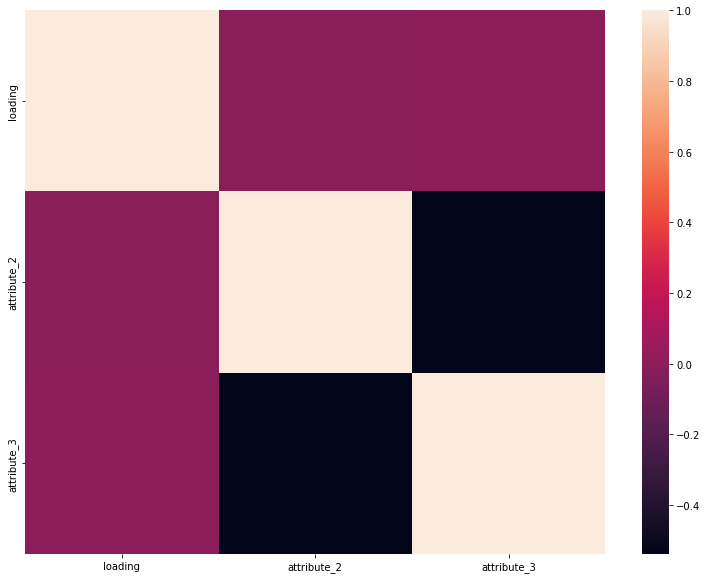

In [31]:
figure = plt.figure(figsize = (13,10))

sns.heatmap(data.corr())

In [27]:
data['failure'].unique()

array([0, 1], dtype=int64)

In [42]:
subset_data = data[['product_code','loading','attribute_0','attribute_1','attribute_2','attribute_3','failure']]

<Figure size 936x720 with 0 Axes>

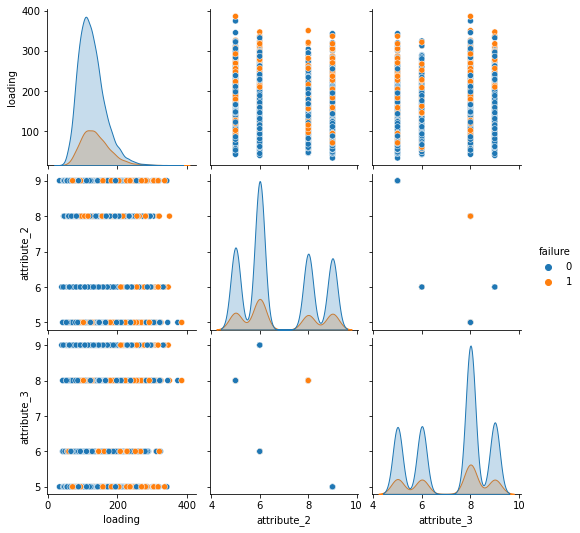

In [43]:
figure = plt.figure(figsize = (13,10))

sns.pairplot(subset_data, hue='failure');

In [44]:
measure_data = data[['measurement_0', 'measurement_1',
       'measurement_2', 'measurement_3', 'measurement_4', 'measurement_5',
       'measurement_6', 'measurement_7', 'measurement_8', 'measurement_9',
       'measurement_10', 'measurement_11', 'measurement_12', 'measurement_13',
       'measurement_14', 'measurement_15', 'measurement_16', 'measurement_17',
       'failure']]

<Figure size 936x720 with 0 Axes>

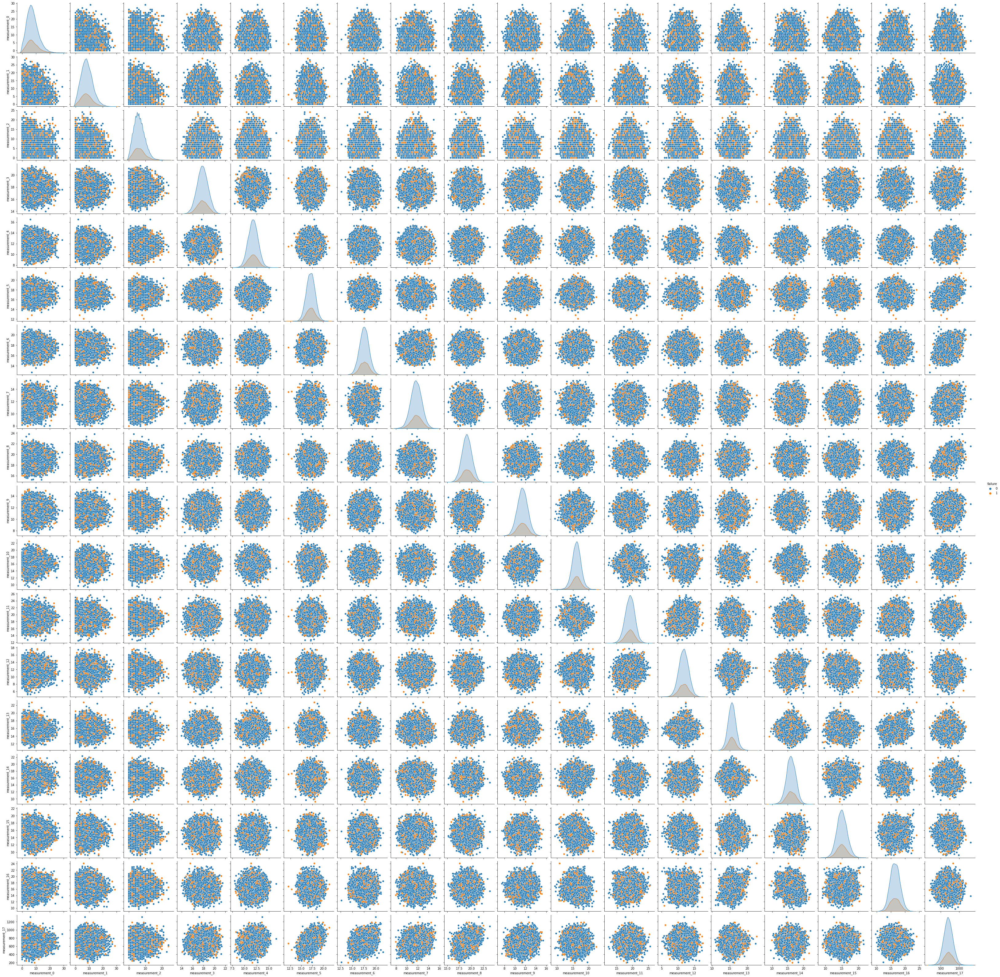

In [45]:
figure = plt.figure(figsize = (13,10))

sns.pairplot(measure_data, hue='failure');

<AxesSubplot:xlabel='product_code', ylabel='Count'>

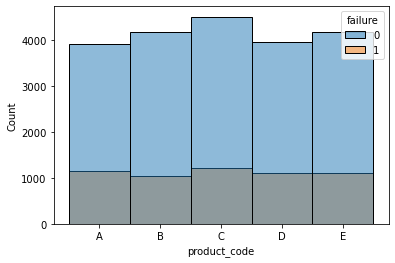

In [52]:
sns.histplot(data = data, x = 'product_code', hue = 'failure')


## Preprocessing and Modeling!

We have a supervised learning problem where we have 2 categories: 0 and 1

We want to use a supervised classification algorithm.

Some choices that we have are:
- logistic regression
- SVM implementation
- Decision Trees (XGBoost or LightGBM)


In [55]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics

In [74]:
data

,id,product_code,loading,attribute_0,attribute_1,attribute_2,attribute_3,measurement_0,measurement_1,measurement_2,...,measurement_9,measurement_10,measurement_11,measurement_12,measurement_13,measurement_14,measurement_15,measurement_16,measurement_17,failure
0,0,A,80.10,material_7,material_8,9,5,7,8,4,...,10.672,15.859,17.594,15.193,15.029,NaN,13.034,14.684,764.100,0
1,1,A,84.89,material_7,material_8,9,5,14,3,3,...,12.448,17.947,17.915,11.755,14.732,15.425,14.395,15.631,682.057,0
2,2,A,82.43,material_7,material_8,9,5,12,1,5,...,12.715,15.607,NaN,13.798,16.711,18.631,14.094,17.946,663.376,0
3,3,A,101.07,material_7,material_8,9,5,13,2,6,...,12.471,16.346,18.377,10.020,15.250,15.562,16.154,17.172,826.282,0
4,4,A,188.06,material_7,material_8,9,5,9,2,8,...,10.337,17.082,19.932,12.428,16.182,12.760,13.153,16.412,579.885,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26565,26565,E,158.95,material_7,material_6,6,9,6,16,4,...,NaN,12.177,17.942,10.112,15.795,18.572,16.144,NaN,729.131,0
26566,26566,E,146.02,material_7,material_6,6,9,10,12,8,...,11.242,14.179,20.564,10.234,14.450,14.322,13.146,16.471,853.924,0
26567,26567,E,115.62,material_7,material_6,6,9,1,10,1,...,11.407,16.437,17.476,8.668,15.069,16.599,15.590,14.065,750.364,0
26568,26568,E,106.38,material_7,material_6,6,9,2,9,4,...,11.392,17.064,17.814,14.928,16.273,15.485,13.624,12.865,730.156,0


In [152]:
# Convert categorical to one-hot encoding

data = pd.get_dummies(data = data, columns = ['product_code','attribute_0','attribute_1'], drop_first = True)

data.head()

,id,loading,attribute_2,attribute_3,measurement_0,measurement_1,measurement_2,measurement_3,measurement_4,measurement_5,...,measurement_16,measurement_17,failure,product_code_B,product_code_C,product_code_D,product_code_E,attribute_0_material_7,attribute_1_material_6,attribute_1_material_8
0,0,80.10,9,5,7,8,4,18.040,12.518,15.748,...,14.684,764.100,0,0,0,0,0,1,0,1
1,1,84.89,9,5,14,3,3,18.213,11.540,17.717,...,15.631,682.057,0,0,0,0,0,1,0,1
2,2,82.43,9,5,12,1,5,18.057,11.652,16.738,...,17.946,663.376,0,0,0,0,0,1,0,1
3,3,101.07,9,5,13,2,6,17.295,11.188,18.576,...,17.172,826.282,0,0,0,0,0,1,0,1
4,4,188.06,9,5,9,2,8,19.346,12.950,16.990,...,16.412,579.885,0,0,0,0,0,1,0,1


In [96]:
# Lets imput our missing data
#data = data.fillna(data.mean())
#data.isna().sum()

id                        0
loading                   0
attribute_2               0
attribute_3               0
measurement_0             0
measurement_1             0
measurement_2             0
measurement_3             0
measurement_4             0
measurement_5             0
measurement_6             0
measurement_7             0
measurement_8             0
measurement_9             0
measurement_10            0
measurement_11            0
measurement_12            0
measurement_13            0
measurement_14            0
measurement_15            0
measurement_16            0
measurement_17            0
failure                   0
product_code_B            0
product_code_C            0
product_code_D            0
product_code_E            0
attribute_0_material_7    0
attribute_1_material_6    0
attribute_1_material_8    0
dtype: int64

In [153]:
#Lets drop all Na
data_nona = data.dropna(axis = 0)
data_nona.isna().sum()

id                        0
loading                   0
attribute_2               0
attribute_3               0
measurement_0             0
measurement_1             0
measurement_2             0
measurement_3             0
measurement_4             0
measurement_5             0
measurement_6             0
measurement_7             0
measurement_8             0
measurement_9             0
measurement_10            0
measurement_11            0
measurement_12            0
measurement_13            0
measurement_14            0
measurement_15            0
measurement_16            0
measurement_17            0
failure                   0
product_code_B            0
product_code_C            0
product_code_D            0
product_code_E            0
attribute_0_material_7    0
attribute_1_material_6    0
attribute_1_material_8    0
dtype: int64

In [154]:
X = data_nona.drop(columns=['id','failure'])
y = data_nona['failure']

In [155]:
X.head()

,loading,attribute_2,attribute_3,measurement_0,measurement_1,measurement_2,measurement_3,measurement_4,measurement_5,measurement_6,...,measurement_15,measurement_16,measurement_17,product_code_B,product_code_C,product_code_D,product_code_E,attribute_0_material_7,attribute_1_material_6,attribute_1_material_8
1,84.89,9,5,14,3,3,18.213,11.540,17.717,17.893,...,14.395,15.631,682.057,0,0,0,0,1,0,1
3,101.07,9,5,13,2,6,17.295,11.188,18.576,18.339,...,16.154,17.172,826.282,0,0,0,0,1,0,1
4,188.06,9,5,9,2,8,19.346,12.950,16.990,15.746,...,13.153,16.412,579.885,0,0,0,0,1,0,1
7,177.92,9,5,4,8,8,17.062,13.634,17.879,15.894,...,15.176,17.231,684.000,0,0,0,0,1,0,1
11,175.38,9,5,7,3,2,17.029,11.507,18.377,16.338,...,15.175,15.829,792.591,0,0,0,0,1,0,1


In [156]:
y.head()

1     0
3     0
4     0
7     1
11    1
Name: failure, dtype: int64

In [157]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 101)

In [158]:
data_nona.shape

(12183, 30)

In [159]:
X_train.shape

(8528, 28)

In [160]:
X_test.shape

(3655, 28)

In [161]:
y_train.shape

(8528,)

In [162]:
y_test.shape

(3655,)

In [172]:
# Lets scale our data
from sklearn.preprocessing import StandardScaler

In [108]:
scaler = StandardScaler()

In [173]:
scaler.fit(X_train)

StandardScaler()

In [174]:
X_train_tf = scaler.transform(X_train)

In [175]:
X_test_tf = scaler.transform(X_test)

## Logistic Regression

In [166]:
lr = LogisticRegression(max_iter = 10000)
lr

LogisticRegression(max_iter=10000)

In [167]:
lr.fit(X_train, y_train)

LogisticRegression(max_iter=10000)

In [168]:
y_pred = lr.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [169]:
metrics.confusion_matrix(y_test, y_pred)

array([[2886,    6],
       [ 763,    0]], dtype=int64)

## LightGBM

In [189]:
from lightgbm import LGBMClassifier

In [185]:
data = pd.read_csv('./data/train.csv')
data.head()

,id,product_code,loading,attribute_0,attribute_1,attribute_2,attribute_3,measurement_0,measurement_1,measurement_2,...,measurement_9,measurement_10,measurement_11,measurement_12,measurement_13,measurement_14,measurement_15,measurement_16,measurement_17,failure
0,0,A,80.10,material_7,material_8,9,5,7,8,4,...,10.672,15.859,17.594,15.193,15.029,NaN,13.034,14.684,764.100,0
1,1,A,84.89,material_7,material_8,9,5,14,3,3,...,12.448,17.947,17.915,11.755,14.732,15.425,14.395,15.631,682.057,0
2,2,A,82.43,material_7,material_8,9,5,12,1,5,...,12.715,15.607,NaN,13.798,16.711,18.631,14.094,17.946,663.376,0
3,3,A,101.07,material_7,material_8,9,5,13,2,6,...,12.471,16.346,18.377,10.020,15.250,15.562,16.154,17.172,826.282,0
4,4,A,188.06,material_7,material_8,9,5,9,2,8,...,10.337,17.082,19.932,12.428,16.182,12.760,13.153,16.412,579.885,0


In [190]:
data = pd.get_dummies(data = data, columns = ['product_code','attribute_0','attribute_1'], drop_first = True)

data.head()

,id,loading,attribute_2,attribute_3,measurement_0,measurement_1,measurement_2,measurement_3,measurement_4,measurement_5,...,measurement_16,measurement_17,failure,product_code_B,product_code_C,product_code_D,product_code_E,attribute_0_material_7,attribute_1_material_6,attribute_1_material_8
0,0,80.10,9,5,7,8,4,18.040,12.518,15.748,...,14.684,764.100,0,0,0,0,0,1,0,1
1,1,84.89,9,5,14,3,3,18.213,11.540,17.717,...,15.631,682.057,0,0,0,0,0,1,0,1
2,2,82.43,9,5,12,1,5,18.057,11.652,16.738,...,17.946,663.376,0,0,0,0,0,1,0,1
3,3,101.07,9,5,13,2,6,17.295,11.188,18.576,...,17.172,826.282,0,0,0,0,0,1,0,1
4,4,188.06,9,5,9,2,8,19.346,12.950,16.990,...,16.412,579.885,0,0,0,0,0,1,0,1


In [191]:
X = data.drop(columns=['id','failure'])
y = data['failure']

In [192]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 101)

In [193]:
lgb = LGBMClassifier(num_leaves = 50)

In [194]:
lgb.fit(X_train, y_train)

LGBMClassifier()

In [196]:
y_pred = lgb.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [197]:
metrics.confusion_matrix(y_test,y_pred)

array([[6224,   13],
       [1724,   10]], dtype=int64)

In [201]:
import lightgbm
from bayes_opt import BayesianOptimization
from catboost import CatBoostClassifier, cv, Pool

In [204]:
def lgb_eval(num_leaves,max_depth,lambda_l2,lambda_l1,min_child_samples, min_data_in_leaf):
    params = {
        "objective" : "binary",
        "metric" : "auc", 
        'is_unbalance': True,
        "num_leaves" : int(num_leaves),
        "max_depth" : int(max_depth),
        "lambda_l2" : lambda_l2,
        "lambda_l1" : lambda_l1,
        "num_threads" : 20,
        "min_child_samples" : int(min_child_samples),
        'min_data_in_leaf': int(min_data_in_leaf),
        "learning_rate" : 0.03,
        "subsample_freq" : 5,
        "bagging_seed" : 42,
        "verbosity" : -1
    }
    lgtrain = lightgbm.Dataset(X_train, y_train)
    cv_result = lightgbm.cv(params,
                       lgtrain,
                       1000,
                       early_stopping_rounds=100,
                       stratified=True,
                       nfold=3)
    return cv_result['auc-mean'][-1]

In [205]:
lgbBO = BayesianOptimization(lgb_eval, {'num_leaves': (25, 4000),
                                                'max_depth': (5, 63),
                                                'lambda_l2': (0.0, 0.05),
                                                'lambda_l1': (0.0, 0.05),
                                                'min_child_samples': (50, 10000),
                                                'min_data_in_leaf': (100, 2000)
                                                })

lgbBO.maximize(n_iter=10, init_points=2)

|   iter    |  target   | lambda_l1 | lambda_l2 | max_depth | min_ch... | min_da... | num_le... |
-------------------------------------------------------------------------------------------------
[LightGBM] [Warning] min_data_in_leaf is set=533, min_child_samples=2646 will be ignored. Current value: min_data_in_leaf=533
|  1        |  0.5796   |  0.01929  |  0.001139 |  12.49    |  2.647e+0 |  533.3    |  3.597e+0 |
|  2        |  0.5866   |  0.01245  |  0.002017 |  31.02    |  3.206e+0 |  1.588e+0 |  758.3    |
|  3        |  0.5835   |  0.04316  |  0.005076 |  13.88    |  6.775e+0 |  970.1    |  2.841e+0 |
|  4        |  0.5791   |  0.034    |  0.03805  |  29.89    |  5.232e+0 |  601.7    |  3.942e+0 |
|  5        |  0.5871   |  0.03771  |  0.006936 |  14.3     |  251.6    |  1.833e+0 |  2.786e+0 |
|  6        |  0.5868   |  0.01435  |  0.02221  |  7.056    |  4.491e+0 |  1.881e+0 |  2.784e+0 |
|  7        |  0.5866   |  0.000559 |  0.02327  |  13.26    |  4.296e+0 |  1.613e+0 |  1.0

In [206]:
lgbBO.max

{'target': 0.5870769767794028,
 'params': {'lambda_l1': 0.037713688241066766,
  'lambda_l2': 0.006935906130040682,
  'max_depth': 14.303859352755978,
  'min_child_samples': 251.62727116178357,
  'min_data_in_leaf': 1833.4477636493966,
  'num_leaves': 2785.9806308804473}}

In [207]:
lgb = LGBMClassifier(reg_alpha = 0.0377, reg_lambda = 0.0069, max_depth = 14, min_child_samples = 251, num_leaves = 2785)

In [208]:
lgb.fit(X_train, y_train)

LGBMClassifier(max_depth=14, min_child_samples=251, num_leaves=2785,
               reg_alpha=0.0377, reg_lambda=0.0069)

In [209]:
y_pred = lgb.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [210]:
metrics.confusion_matrix(y_test,y_pred)

array([[6221,   16],
       [1721,   13]], dtype=int64)